# Neural Network(gas_turbines)

In [46]:
import pandas as pd
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score
from keras.models import Sequential
from keras.layers import Dense
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [47]:
data=pd.read_csv("gas_turbines.csv")

In [48]:
pd.set_option("display.max_rows",None)
data 

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,6.85940,1007.90,96.799,3.5000,19.663,1059.2,550.00,114.70,10.6050,3.154700,82.722
1,6.78500,1008.40,97.118,3.4998,19.728,1059.3,550.00,114.72,10.5980,3.236300,82.776
2,6.89770,1008.80,95.939,3.4824,19.779,1059.4,549.87,114.71,10.6010,3.201200,82.468
3,7.05690,1009.20,95.249,3.4805,19.792,1059.6,549.99,114.72,10.6060,3.192300,82.670
4,7.39780,1009.70,95.150,3.4976,19.765,1059.7,549.98,114.72,10.6120,3.248400,82.311
5,7.69980,1010.70,92.708,3.5236,19.683,1059.8,549.97,114.72,10.6260,3.446700,82.409
6,7.79010,1011.60,91.983,3.5298,19.659,1060.0,549.87,114.71,10.6440,3.487400,82.440
7,7.71390,1012.70,91.348,3.5088,19.673,1059.8,549.92,114.71,10.6560,3.604300,83.010
8,7.79750,1013.80,90.196,3.5141,19.634,1060.1,550.09,114.72,10.6440,3.394300,82.284
9,8.08200,1015.00,88.597,4.0612,23.406,1083.0,550.21,131.70,11.6790,1.908100,82.782


In [49]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15039 entries, 0 to 15038
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      15039 non-null  float64
 1   AP      15039 non-null  float64
 2   AH      15039 non-null  float64
 3   AFDP    15039 non-null  float64
 4   GTEP    15039 non-null  float64
 5   TIT     15039 non-null  float64
 6   TAT     15039 non-null  float64
 7   TEY     15039 non-null  float64
 8   CDP     15039 non-null  float64
 9   CO      15039 non-null  float64
 10  NOX     15039 non-null  float64
dtypes: float64(11)
memory usage: 1.3 MB


In [50]:
data.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,15039.000000,15039.00000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000,15039.000000
mean,17.764381,1013.19924,79.124174,4.200294,25.419061,1083.798770,545.396183,134.188464,12.102353,1.972499,68.190934
std,7.574323,6.41076,13.793439,0.760197,4.173916,16.527806,7.866803,15.829717,1.103196,2.222206,10.470586
min,0.522300,985.85000,30.344000,2.087400,17.878000,1000.800000,512.450000,100.170000,9.904400,0.000388,27.765000
25%,11.408000,1008.90000,69.750000,3.723900,23.294000,1079.600000,542.170000,127.985000,11.622000,0.858055,61.303500
50%,18.186000,1012.80000,82.266000,4.186200,25.082000,1088.700000,549.890000,133.780000,12.025000,1.390200,66.601000
75%,23.862500,1016.90000,90.043500,4.550900,27.184000,1096.000000,550.060000,140.895000,12.578000,2.160400,73.935500
max,34.929000,1034.20000,100.200000,7.610600,37.402000,1100.800000,550.610000,174.610000,15.081000,44.103000,119.890000


In [51]:
data.isnull().sum()

AT      0
AP      0
AH      0
AFDP    0
GTEP    0
TIT     0
TAT     0
TEY     0
CDP     0
CO      0
NOX     0
dtype: int64

In [52]:
data[data.duplicated()]

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX


C:\Users\Pavani\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


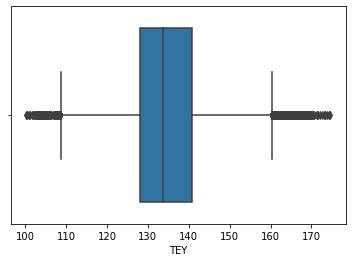

In [53]:
#Checkinng for outliers
ax = sns.boxplot(data['TEY'])

In [54]:
# Changing position of target column 'TEY' to 0th place
Target = data['TEY']
#Drop the existing column
data.drop(labels=['TEY'], axis=1,inplace = True)
data.insert(0, 'Y', Target)

data = data.rename({'Y':'TEY'}, axis = 1)

data.head()

,TEY,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX
0,114.70,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.00,10.605,3.1547,82.722
1,114.72,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.00,10.598,3.2363,82.776
2,114.71,6.8977,1008.8,95.939,3.4824,19.779,1059.4,549.87,10.601,3.2012,82.468
3,114.72,7.0569,1009.2,95.249,3.4805,19.792,1059.6,549.99,10.606,3.1923,82.670
4,114.72,7.3978,1009.7,95.150,3.4976,19.765,1059.7,549.98,10.612,3.2484,82.311


In [55]:
corr = data[data.columns[0:11]].corr()

<AxesSubplot:>

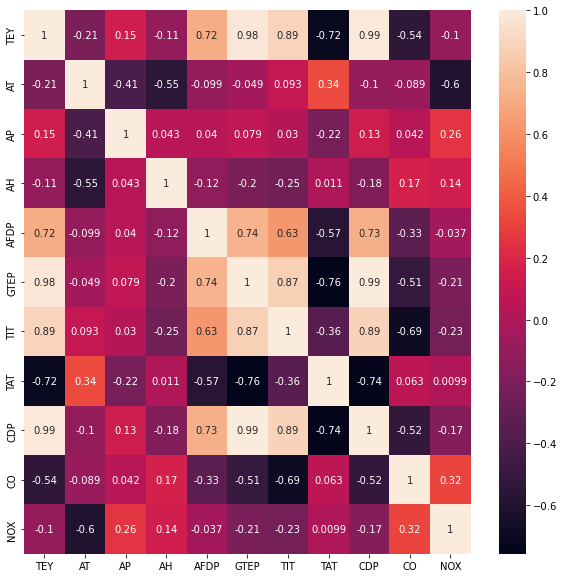

In [56]:
plt.figure(figsize=(10,10))
sns.heatmap(corr,annot=True)

In [57]:
data.corr()

,TEY,AT,AP,AH,AFDP,GTEP,TIT,TAT,CDP,CO,NOX
TEY,1.000000,-0.207495,0.146939,-0.110272,0.717995,0.977042,0.891587,-0.720356,0.988473,-0.541751,-0.102631
AT,-0.207495,1.000000,-0.412953,-0.549432,-0.099333,-0.049103,0.093067,0.338569,-0.100705,-0.088588,-0.600006
AP,0.146939,-0.412953,1.000000,0.042573,0.040318,0.078575,0.029650,-0.223479,0.131198,0.041614,0.256744
AH,-0.110272,-0.549432,0.042573,1.000000,-0.119249,-0.202784,-0.247781,0.010859,-0.182010,0.165505,0.143061
AFDP,0.717995,-0.099333,0.040318,-0.119249,1.000000,0.744251,0.627254,-0.571541,0.727152,-0.334207,-0.037299
GTEP,0.977042,-0.049103,0.078575,-0.202784,0.744251,1.000000,0.874526,-0.756884,0.993784,-0.508259,-0.208496
TIT,0.891587,0.093067,0.029650,-0.247781,0.627254,0.874526,1.000000,-0.357320,0.887238,-0.688272,-0.231636
TAT,-0.720356,0.338569,-0.223479,0.010859,-0.571541,-0.756884,-0.357320,1.000000,-0.744740,0.063404,0.009888
CDP,0.988473,-0.100705,0.131198,-0.182010,0.727152,0.993784,0.887238,-0.744740,1.000000,-0.520783,-0.169103
CO,-0.541751,-0.088588,0.041614,0.165505,-0.334207,-0.508259,-0.688272,0.063404,-0.520783,1.000000,0.316743


## Feature Selection by using Mutual Information Feature Selection

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

In [59]:
x = data.iloc[:,1:]
y = data.iloc[:,0]

In [60]:
# feature selection
def select_features(x_train, y_train, x_test):
    # configure to select all features
    fs = SelectKBest(score_func=mutual_info_regression, k='all')
    # learn relationship from training data
    fs.fit(x_train, y_train)
    # transform train input data
    x_train_fs = fs.transform(x_train)
    # transform test input data
    x_test_fs = fs.transform(x_test)
    return x_train_fs, x_test_fs, fs

In [61]:
# Splitting data into training to 67% and testing to 33% in data set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=1)
# feature selection
x_train_fs, x_test_fs, fs = select_features(x_train, y_train, x_test)

Feature 0: 0.402993
Feature 1: 0.146408
Feature 2: 0.091029
Feature 3: 0.657125
Feature 4: 1.590464
Feature 5: 1.305660
Feature 6: 0.913570
Feature 7: 1.707780
Feature 8: 0.507550
Feature 9: 0.304114


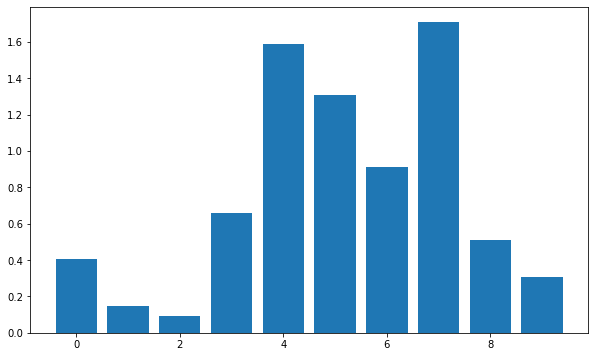

In [62]:
# what are scores for the features
for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
fig, ax = plt.subplots(figsize=(10, 6))
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

#### As per above feature selection method, we are going to select only features with good score to build our model

In [63]:
x = data.drop(['TEY','AT','AP','AH','CO','NOX'], axis = 1)
y = data.iloc[:,0]

In [64]:
x 

,AFDP,GTEP,TIT,TAT,CDP
0,3.5000,19.663,1059.2,550.00,10.6050
1,3.4998,19.728,1059.3,550.00,10.5980
2,3.4824,19.779,1059.4,549.87,10.6010
3,3.4805,19.792,1059.6,549.99,10.6060
4,3.4976,19.765,1059.7,549.98,10.6120
5,3.5236,19.683,1059.8,549.97,10.6260
6,3.5298,19.659,1060.0,549.87,10.6440
7,3.5088,19.673,1059.8,549.92,10.6560
8,3.5141,19.634,1060.1,550.09,10.6440
9,4.0612,23.406,1083.0,550.21,11.6790


In [65]:
y 

0        114.70
1        114.72
2        114.71
3        114.72
4        114.72
5        114.72
6        114.71
7        114.71
8        114.72
9        131.70
10       133.67
11       134.24
12       134.69
13       134.68
14       134.68
15       134.69
16       134.69
17       134.69
18       134.68
19       134.68
20       134.67
21       133.78
22       134.11
23       112.80
24       122.33
25       133.94
26       150.33
27       134.24
28       150.02
29       150.50
30       147.72
31       150.60
32       134.10
33       139.70
34       142.04
35       145.76
36       149.63
37       134.62
38       134.37
39       133.75
40       134.70
41       134.32
42       135.89
43       135.05
44       116.72
45       135.07
46       134.61
47       156.91
48       158.69
49       151.81
50       149.86
51       149.72
52       151.60
53       133.70
54       133.59
55       134.77
56       133.41
57       139.36
58       135.71
59       133.29
60       134.86
61       134.65
62      

# 1. Artificial Neural Network Model - Backpropagation

In [66]:
# Splitting data into training to 80% and testing to 20% in data set  for Artificial Neural Network model
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20)

In [67]:
from keras.models import Sequential
from keras.layers import Dense

In [68]:
# create model
model = Sequential()
model.add(Dense(10, input_dim=5, activation='relu'))
model.add(Dense(6, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [69]:
# Compile model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])

In [70]:
# Fit the model
history=model.fit(x, y, validation_split=0.33, epochs=100, batch_size=40)

Epoch 1/100
252/252 [==============================] - 6s 15ms/step - loss: 18559.6094 - mse: 18559.6074 - val_loss: 17642.9688 - val_mse: 17642.9668
Epoch 2/100
252/252 [==============================] - 1s 5ms/step - loss: 18559.6055 - mse: 18559.6055 - val_loss: 17642.9688 - val_mse: 17642.9668
Epoch 3/100
252/252 [==============================] - 1s 6ms/step - loss: 18559.6094 - mse: 18559.6094 - val_loss: 17642.9688 - val_mse: 17642.9668
Epoch 4/100
252/252 [==============================] - 1s 5ms/step - loss: 18559.6055 - mse: 18559.6055 - val_loss: 17642.9688 - val_mse: 17642.9668
Epoch 5/100
252/252 [==============================] - 1s 5ms/step - loss: 18559.6133 - mse: 18559.6133 - val_loss: 17642.9688 - val_mse: 17642.9668
Epoch 6/100
252/252 [==============================] - 1s 6ms/step - loss: 18559.6074 - mse: 18559.6074 - val_loss: 17642.9688 - val_mse: 17642.9668
Epoch 7/100
252/252 [==============================] - 1s 5ms/step - loss: 18559.6074 - mse: 18559.6074 -

In [71]:
# evaluate the model
scores = model.evaluate(x, y)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

470/470 [==============================] - 2s 5ms/step - loss: 18257.1094 - mse: 18257.1094
mse: 1825710.94%


## Hyper Parameter Tuning

In [72]:
X = data.drop(['TEY','AT','AP','AH','CO','NOX'], axis = 1)
Y = data.iloc[:,0]

In [73]:
# Standardization
from sklearn.preprocessing import StandardScaler
a = StandardScaler()
a.fit(X)
X_standardized = a.transform(X)

In [74]:
pd.DataFrame(X_standardized).describe()

,0,1,2,3,4
count,1.503900e+04,1.503900e+04,1.503900e+04,1.503900e+04,1.503900e+04
mean,3.810001e-16,1.107344e-16,-2.324212e-15,1.744899e-15,3.640356e-16
std,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00
min,-2.779497e+00,-1.806771e+00,-5.021933e+00,-4.188141e+00,-1.992416e+00
25%,-6.266930e-01,-5.091458e-01,-2.540512e-01,-4.101146e-01,-4.354335e-01
50%,-1.854065e-02,-8.075681e-02,2.965544e-01,5.712570e-01,-7.011925e-02
75%,4.612196e-01,4.228638e-01,7.382490e-01,5.928675e-01,4.311680e-01
max,4.486233e+00,2.871006e+00,1.028678e+00,6.627839e-01,2.700105e+00


## Tuning of All Hyperparameters

In [75]:
# Importing the necessary packages
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.optimizers import Adam
from keras.layers import Dropout

In [76]:
# Splitting data into test data and train data

from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

In [77]:
def create_model(learning_rate,dropout_rate,activation_function,init,neuron1,neuron2):
    model = Sequential()
    model.add(Dense(neuron1,input_dim = 5,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neuron2,input_dim = neuron1,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1,activation = 'sigmoid'))
    
    adam = Adam(lr = learning_rate)
    model.compile(loss = 'mean_squared_error',optimizer = adam,metrics = ['mse'])
    return model

In [78]:
# Create the model

model = KerasClassifier(build_fn = create_model,verbose = 0)

C:\Users\Pavani\AppData\Local\Temp/ipykernel_10732/2849873856.py:3: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasClassifier(build_fn = create_model,verbose = 0)


In [79]:
# Define the grid search parameters

batch_size = [10,20,40]
epochs = [10,50,100]
learning_rate = [0.001,0.01,0.1]
dropout_rate = [0.0,0.1,0.2]
activation_function = ['softmax','relu','tanh','linear']
init = ['uniform','normal','zero']
neuron1 = [4,8,16]
neuron2 = [2,4,8]

In [80]:
# Make a dictionary of the grid search parameters

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init,neuron1 = neuron1,neuron2 = neuron2)

In [81]:
# Build and fit the GridSearchCV

grid = GridSearchCV(estimator = model,param_grid = param_grids,verbose = 10, scoring='neg_mean_squared_error')
grid_result = grid.fit(X, Y)

# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))

Fitting 5 folds for each of 8748 candidates, totalling 43740 fits
[CV 1/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2


C:\Users\Pavani\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


[CV 1/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=-1600.483 total time=  39.3s
[CV 2/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2


C:\Users\Pavani\anaconda3\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


KeyboardInterrupt: 